# Análisis sonoro

La clasificación de sonidos es una de las aplicaciones más extendidas en Deep Learning. Consiste en aprender a clasificar sonidos y predecir la categoría de ese sonido, es este caso, la especie de ave. El problema inicial es la falta de enfoque al no haber realizado nunca un problema de este estilo. Por tanto, se propone el siguiente *workflow*:
1. Convertir las audiowaves en spectrogramas (las audiowaves es una representación del sonido).
2. Crear un modelos de clasificación linear (RNN)
3. Crear mapas de clasificación (Feature maps)
4. Clasificación lineal que te devuelva un resultado (nombre de la especie)

Utilizaremos las funciones desarrolladas por Ulloa et al. 2021 del módulo de [scikit-maad](https://besjournals.onlinelibrary.wiley.com/doi/epdf/10.1111/2041-210X.13711). Estos autores desarrollaron un software open-source en el que ofrecen una serie de herramientas para el análisis de archivos de audio esenciales. Otra módulos que ofrecen herramientas parecidas y que están disponibles para python son [Librosa](https://librosa.org/doc/latest/index.html) y [pyAudioAnalysis](https://pypi.org/project/pyAudioAnalysis/). La diferencia entre estos módulos es que mientras librosa y pyAudioAnalysis ofrecen soluciones robustas y eficientes para analizar los discursos y la música de grabaciones digitales, scikit-maad ha sido desarrollado para analizar los paisajes sonoros, donde las señales acústicas proceden de seres humanos y de otros organismos vivos y procesos geofísicos. 

Como la base de datos para entrenar el modelos es muy extensa, se seleccionan 5 grabaciones al azar para familiarizarse con los datos en formato sonoro.

***Debido a la eleveda cantidad de audios y el espacio que ocupa en la CPU, se trabajará en la plataforma de Google Collab***

## Descargar los datos desde Kaggle en Google Colab

In [3]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download -c birdclef-2022

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists
100% 6.09G/6.12G [00:30<00:00, 255MB/s]
100% 6.12G/6.12G [00:30<00:00, 217MB/s]


In [4]:
! pip install scikit-maad
! sudo apt-get install python-pyaudio python3-pyaudio
! pip install Ipython

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
python-pyaudio is already the newest version (0.2.11-1build2).
python3-pyaudio is already the newest version (0.2.11-1build2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Lectura de archivos de audio


In [5]:
# Librerias
import os
import numpy as np
import pandas as pd
from utils.OpenZIP import *
from utils.VisAudio import *

# Visualización de audio
import librosa 
import librosa.display
import IPython.display as ipd
from maad import sound
from maad import util
from maad import rois
import matplotlib.pyplot as plt

In [6]:
path = os.getcwd()
zip_name = 'birdclef-2022.zip'

# Extraccion de cinco ficheros para prospectar el análisis sonoro
n_sample = audio_samples(path, zip_name, 3)
n_sample

Audio sample was created


['train_audio/jabwar/XC385099.ogg',
 'train_audio/rorpar/XC209560.ogg',
 'train_audio/leasan/XC545878.ogg']

Como el módulo scikit-maad no tiene opción a la lectura de archivos .ogg, utilizamos las funciones proporcionadas por el módulo librosa. Todas las funciones para leer los archivos de audio .ogg desde una carpeta .zip se encuentran en el ejecutable **OpenZip.py**.

In [7]:
y_list,sr_list,spp,files = open_audio(path, zip_name, n_sample)

Done!


In [8]:
y_list

[array([ 1.2586075e-05,  6.1667779e-06, -6.3084815e-07, ...,
        -2.7847743e-06,  1.6656575e-04,  0.0000000e+00], dtype=float32),
 array([-1.9781908e-06, -2.3767392e-07, -3.9709835e-06, ...,
        -1.5329747e-01, -1.6768542e-01,  0.0000000e+00], dtype=float32),
 array([ 2.4992872e-07, -2.2850982e-06,  2.3611549e-06, ...,
         3.1897312e-06, -3.6889730e-06,  0.0000000e+00], dtype=float32)]

In [9]:
sr_list

[22050, 22050, 22050]

In [10]:
spp

['jabwar', 'rorpar', 'leasan']

In [11]:
files

['XC385099.ogg', 'XC209560.ogg', 'XC545878.ogg']

Lo que se obtiene a partir de una lectura de un archivo de audio son cuatro listas:
- y_list: lista de las series temporales en 1D-numpy array de los audios.
- sr_list: lista de fequencia (Hz) por segundo de las series temporales de los archivos cargados.
- spp: lista de las especies de cada archivo.
- files: nombre (recortado) de las especies.

## Visualización del sonido

La representación del sonido se puede representar en dos dominios diferentes: temporal y espectral. Estas representaciones son fundamentales para entender las señales de audio y sus características. Las representaciones temporales de dos dimensiones son conocidas como **oscilogramas**, donde se grafica la amplitud frente al tiempo. Estos oscilogramas tienen forma de ondas y muestran la forma del sonido a lo largo del tiempo. Por otro lado, los **espectrogramas** es una representación tridimensional del sonido donde se recoge información del tiempo, la amplitud y la fecuencia. Estas representaciones recogen las variaciones la amplitud y la frecuencia a lo largo del tiempo.

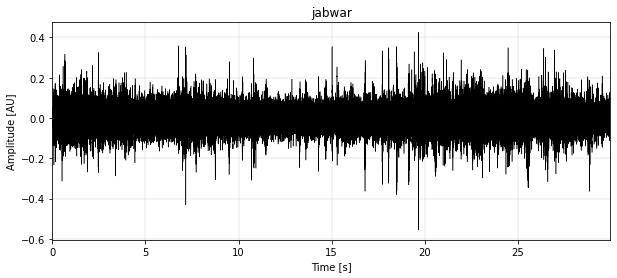

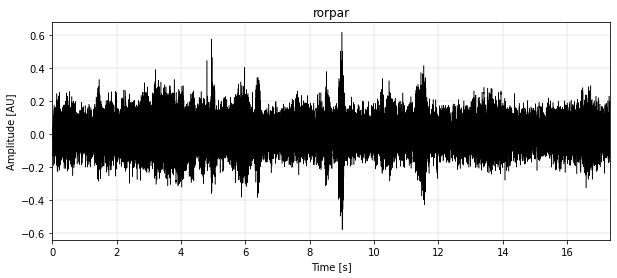

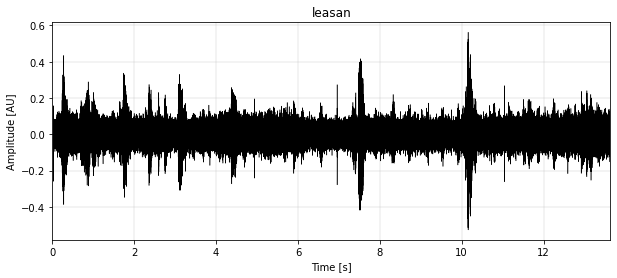

In [12]:
# Representación bidimensional del sonido: oscilograma
sm_waveplot(y_list, sr_list, spp, sound=True)

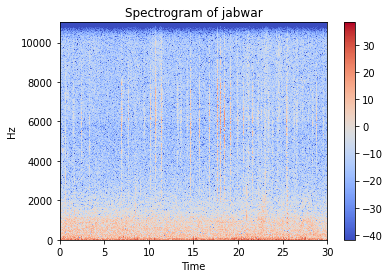

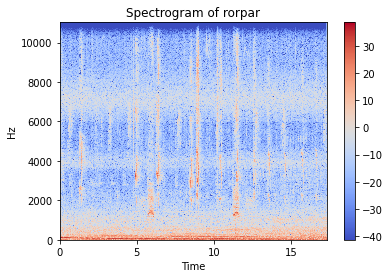

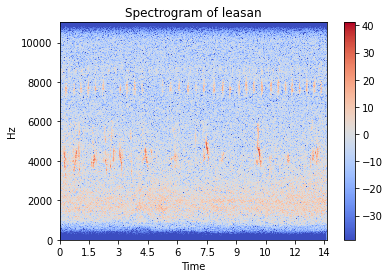

In [13]:
# Representación tridimensional del sonido: espectrograma

## Probamos con el módulo librosa
lib_spec(y_list, sr_list, spp, db=False)

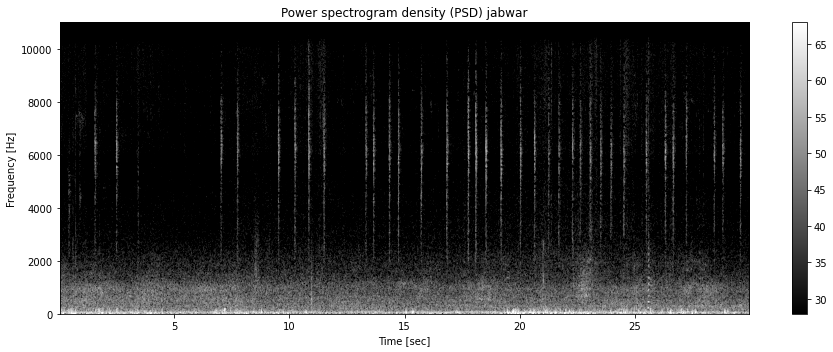

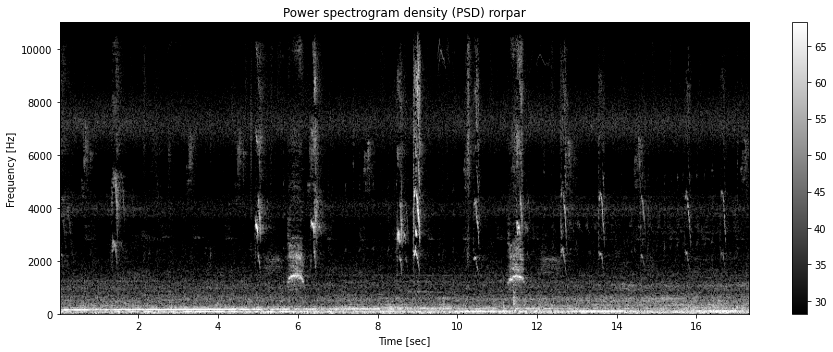

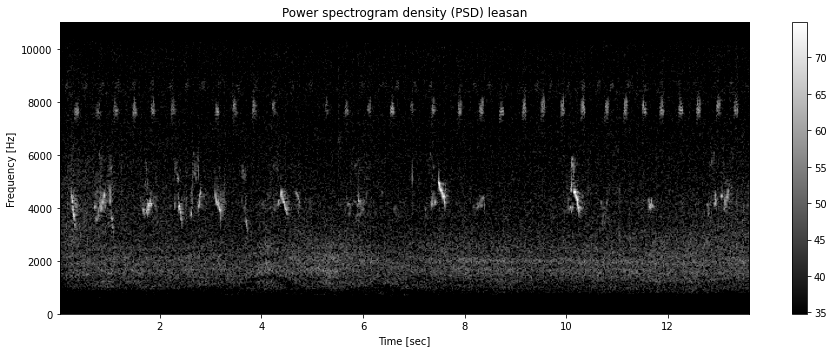

In [14]:
# Probamos con el módulo scikit-maad
sm_espec(y_list, sr_list, spp)

## Espectrogramas de Mel

La gran diferencia entre un espectrograma y un Mel-espectrograma es que el último convierte las frecuencias a una escala conocida como la escala de Mel. Evitando entrar en tecnicismo, digamos que esta transformación en las frecuencias aporta mucha más información en la imagen de audio (ideal para las RNN), que permite modelar con una mejor precisión a la hora de clasificar categorías de sonidos. 

Para obtener un espectrograma de Mel, hay que realizar diversos pasos.


### Transformaciones de Fourier (FFT)

Estas transformaciones permiten crear un dominio de frecuencias a partir de un dominio de tiempo. La magnitud de cada frecuencia es representada en un gráfico lo que permite identificar diferentes frecuencias que conforman el audio. Como si quiesieras representar toda la información de un audio en una instantánea.

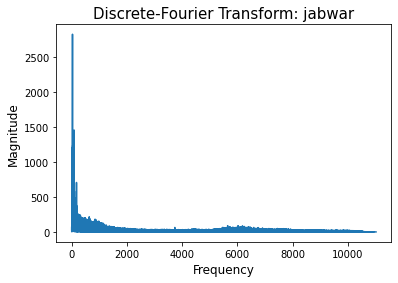

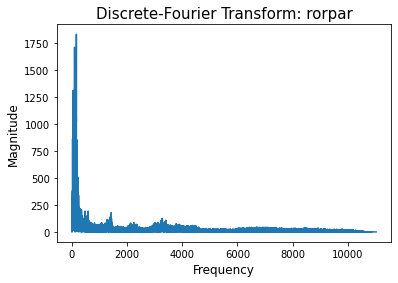

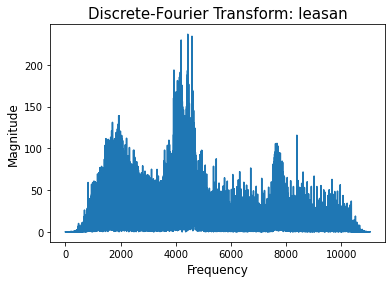

In [21]:
for i in range(len(n_sample)):
  # Creamos un DFT
  fft = np.fft.fft(y_list[i])

  # Calculamos las magnitudes
  # Permiten comprender la contribución de cada frecuencia al sonido
  mag = np.abs(fft)

  # Mapeamos las magnitudes
  freq = np.linspace(0, sr_list[i], len(mag))

  # Como los gráficos son siméticos, solo necesitamos la primera mitad.
  left_mag = mag[:int(len(mag)/2)]
  left_freq = freq[:int(len(freq)/2)]

  # Graficamos
  plt.plot(left_freq, left_mag)
  plt.title('Discrete-Fourier Transform: ' + spp[i], fontdict=dict(size=15))
  plt.xlabel('Frequency', fontdict=dict(size=12))
  plt.ylabel('Magnitude', fontdict=dict(size=12))
  plt.show();

### Short-time Fourier transformation (STFT)

Para generar un espectrograma, no se puede utilizar la FFT, de manera que es necesario segmentar el audio en, por tomar un simil, pequeñas fotografías de la misma película. Para ello se utiliza la STFT.

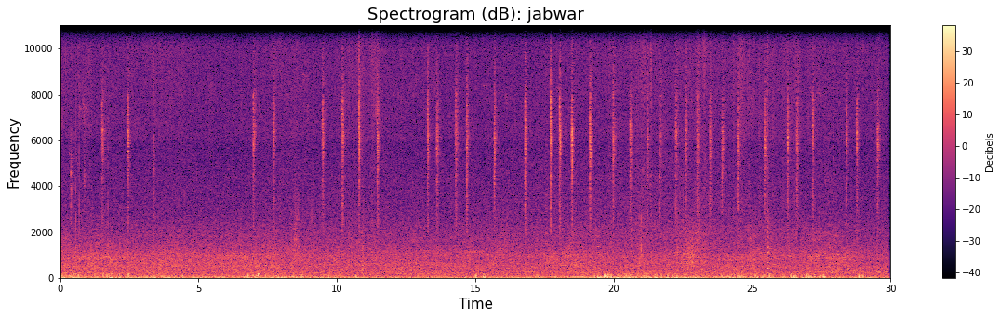

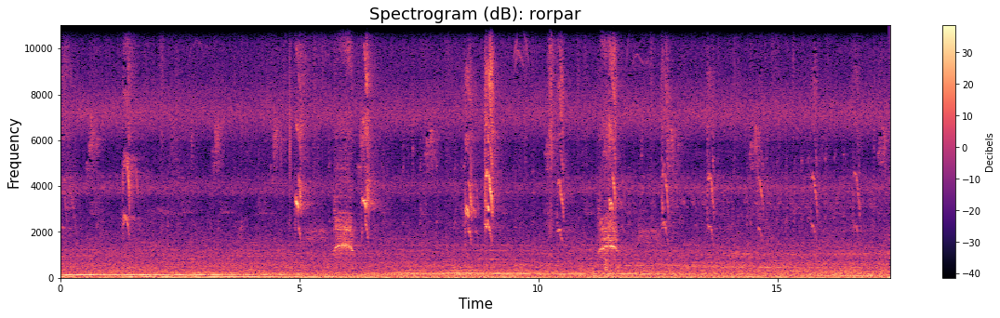

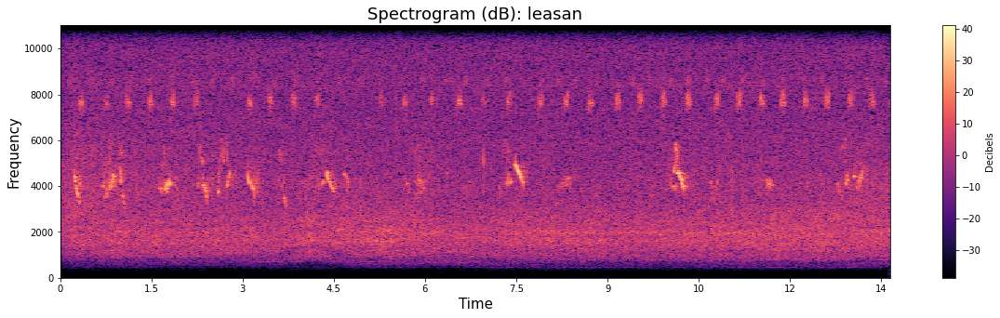

In [23]:
# Cantidad de número de muestras por ventana
n_fft = 2048
# la cantidad de muestras que se cambian despues de cada FFT
hop_length = 512

for i in range(len(n_sample)):

  # Short-time Fourier Transformation 
  stft = librosa.core.stft(y_list[i], hop_length=hop_length, n_fft=n_fft)
  spectrogram = np.abs(stft)

  # Se convierte la amplitud en decibelios
  log_spectro = librosa.amplitude_to_db(spectrogram)

  # Graficamos
  plt.figure(figsize=(20, 5))
  librosa.display.specshow(log_spectro, sr=sr_list[i], x_axis='time', 
                           y_axis='hz', hop_length=hop_length, cmap='magma')
  plt.colorbar(label= 'Decibels')
  plt.title('Spectrogram (dB): ' + spp[i], fontdict=dict(size=18))
  plt.xlabel('Time', fontdict=dict(size=15))
  plt.ylabel('Frequency', fontdict=dict(size=15))
  plt.show();

#### Creación del Espectrograma de Mel

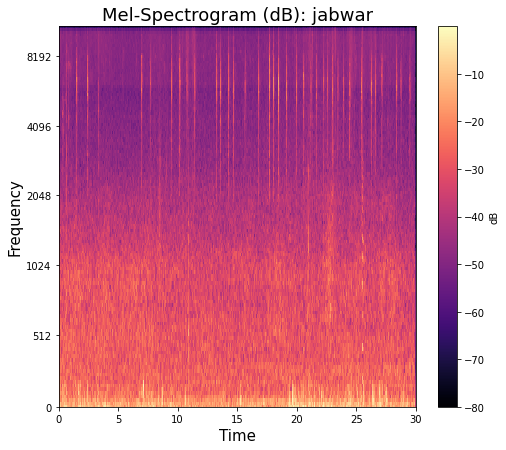

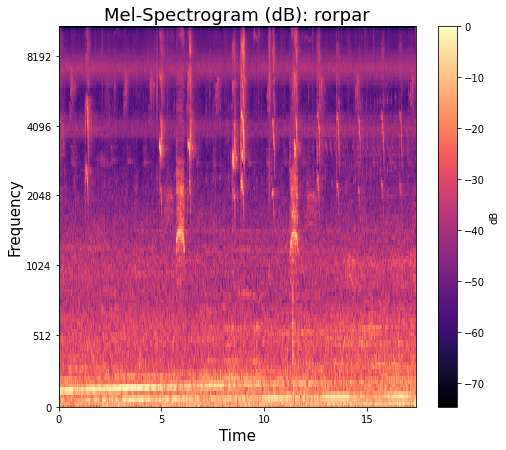

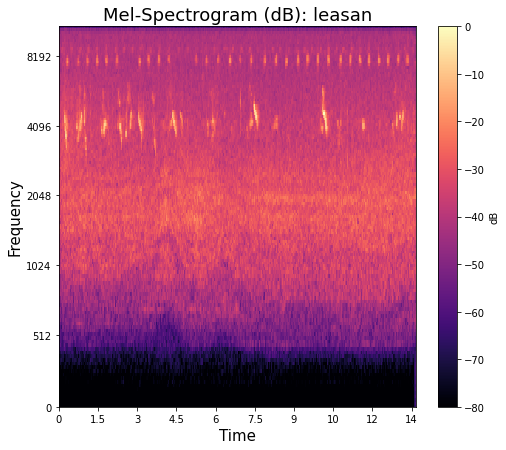

In [30]:
for i in range(len(n_sample)):
  mel = librosa.feature.melspectrogram(y=y_list[i], sr=sr_list[i], 
                                       hop_length=hop_length, n_fft=n_fft)
  spectrogram = np.abs(mel)
  power_to_db = librosa.power_to_db(spectrogram, ref=np.max)

  # # Cleaning the spectrogram
  # rm_bk, noise_profile, _=sound.remove_background(power_to_db)

  # Graficamos
  plt.figure(figsize=(8, 7))
  librosa.display.specshow(power_to_db, sr=sr_list[i], x_axis='time', y_axis='mel', cmap='magma', 
  hop_length=hop_length)
  plt.colorbar(label='dB')
  plt.title('Mel-Spectrogram (dB): ' + spp[i], fontdict=dict(size=18))
  plt.xlabel('Time', fontdict=dict(size=15))
  plt.ylabel('Frequency', fontdict=dict(size=15))
  plt.show();

## Pre-processing: limpieza de los sonidos de fondo

Uno de los grandes retos en el análisis de audios grabados a campo abierto es eliminar todo aquello que se considere *ruido*. En los paisajes naturales, todo aquel sonido correspondiente de procesos abióticos (e.g., el aire o el agua) y de origen antrópico (e.g., los coches de una carretera) se consideran ruido. Por tanto, es necesario eliminarlo del los audios para optimizar el proceso de clasificación. Para ello, el módulo de [scikit-maad](https://besjournals.onlinelibrary.wiley.com/doi/full/10.1111/2041-210X.13711?casa_token=iWVr6FFnXaUAAAAA%3AKgU3Dkqb9s6TXvePNXZBaxYDFCQ57cH9zKB17VXskQO2oNUmkp-RQUZwFqRpHQPVbUyxT8QqDwrvrg) tiene una serie de filtros para eliminar tanto los sonidos estacionarios (e.g., la lluvia) así como incrementar de la vocalización de los sonidos que se quieren clasificar. 


Sound noise ratio (snr) of jabwar = 3.69


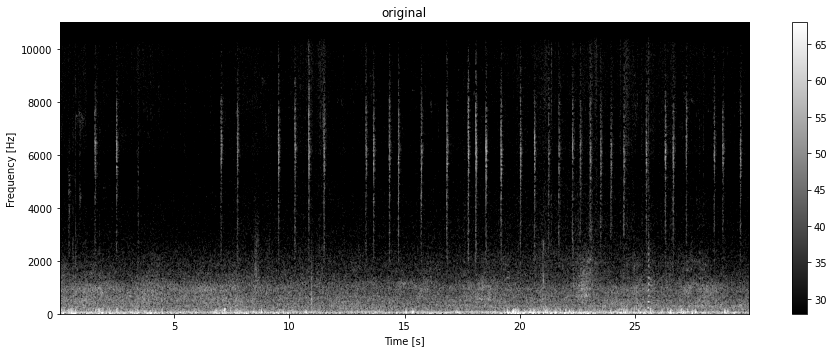

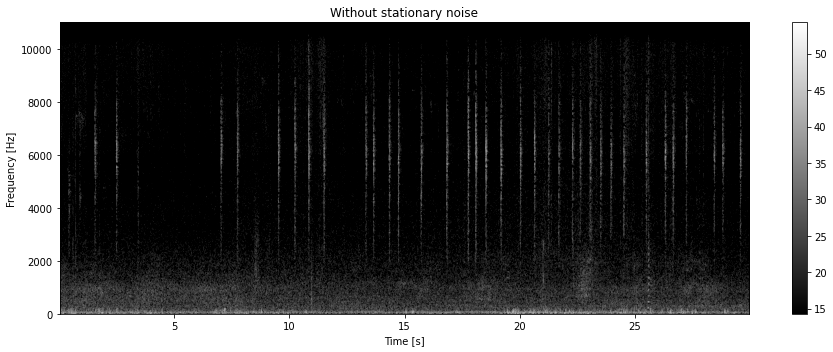

Sound noise ratio (snr) of rorpar = 4.42


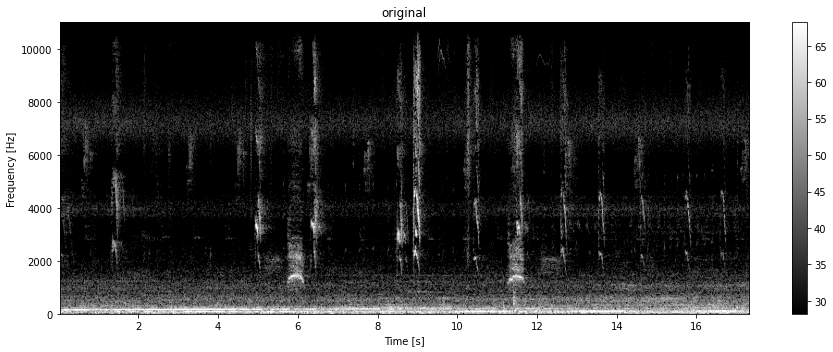

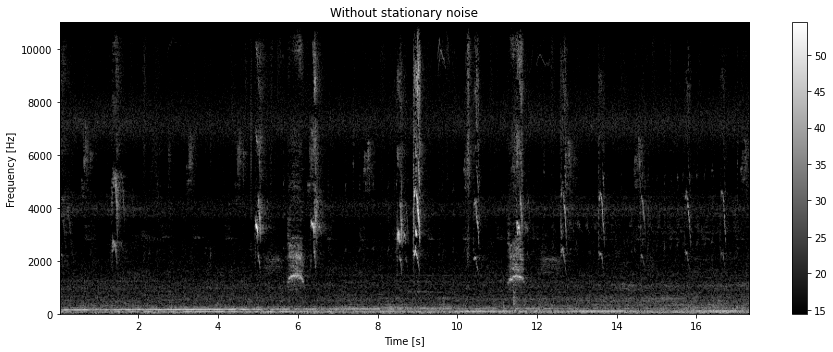

Sound noise ratio (snr) of leasan = 5.3


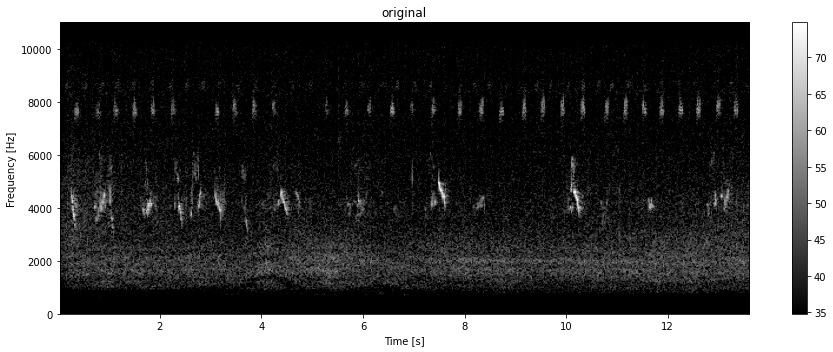

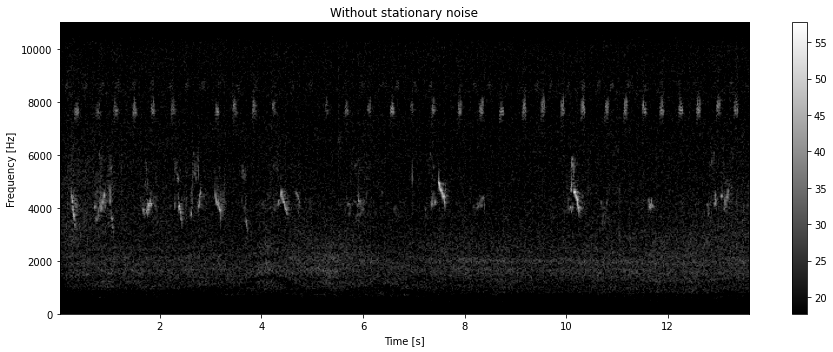

In [16]:
# realizamos un limpieza del sonido de fondo mediante susbtracción espectral
for i in range(len(n_sample)):
  y_power,tn,fn,ext=sound.spectrogram(y_list[i], sr_list[i], method='psd') 
  _, _, snr, _, _, _ = sound.spectral_snr(y_power)
  print(f'Sound noise ratio (snr) of {spp[i]} = {round(snr,2)}')

  # Prepocesado del audio
  y_dB=util.power2dB(y_power, db_range=96) + 96
  rm_bk, noise_profile, _=sound.remove_background(y_dB)

  # Graficamos sonido sin ruidos estacionarios
  util.plot2d(y_dB,extent=ext, title='original', 
                 vmin=np.median(y_dB), vmax=np.median(y_dB)+40,
                 figsize=(4,13))
  plt.show();
  util.plot2d(rm_bk,extent=ext, title='Without stationary noise',
                  vmin=np.median(rm_bk), vmax=np.median(rm_bk)+40,
                  figsize=(4,13))
  plt.show();

  # Guardamos los espectrogramas sin sonido de fondo
  # rm_bk_list.append(rm_bk)
  # y_dB_list.append(y_dB)

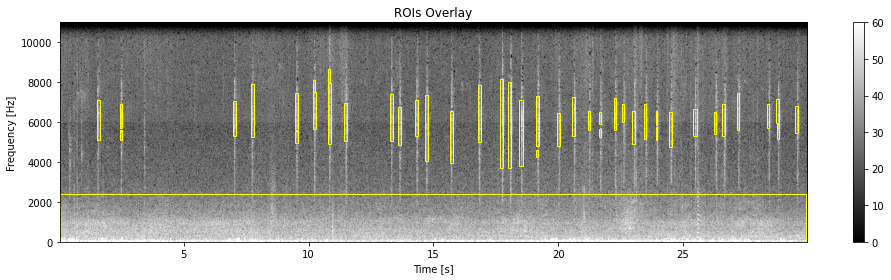

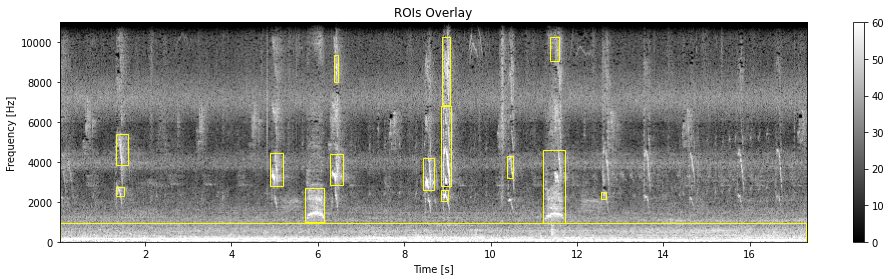

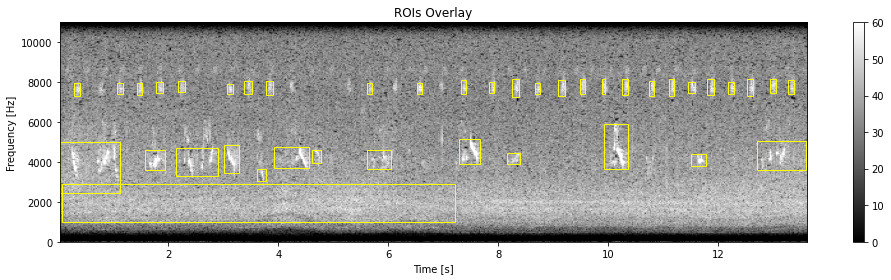

In [17]:
for i in range(len(n_sample)):
  y_power,tn,fn,ext=sound.spectrogram(y_list[i], sr_list[i], method='psd')
  y_dB=util.power2dB(y_power, db_range=96) + 96
  rm_bk, noise_profile, _=sound.remove_background(y_dB) 

  Sxx_db_smooth = sound.smooth(rm_bk, std=1.2)
  im_mask = rois.create_mask(im=Sxx_db_smooth, mode_bin ='relative', bin_std=2, bin_per=0.25)
  im_rois, df_rois = rois.select_rois(im_mask, min_roi=50, max_roi=None)

  # Format ROIs and visualize the bounding box on the audio spectrogram.
  df_rois = util.format_features(df_rois, tn, fn)
  ax0, fig0 = util.overlay_rois(y_dB, df_rois, 
                                **{'vmin':0, 'vmax':60, 'extent':ext, 'figsize':(3,14)})